In [37]:
!pip install h2o
#!pip install -U pandas-profiling ESSE SOMENTE PARA O JUPITER
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Created wheel for pandas-profiling: filename=pandas_profiling-2.10.0-py2.py3-none-any.whl size=239950 sha256=778f7e9685e635532ac6bfd3e4c0c9bc6ca17f90e56f9a7fc646f88ac0f7b4ef
  Stored in directory: /tmp/pip-ephem-wheel-cache-dumrn1ms/wheels/56/c2/dd/8d945b0443c35df7d5f62fa9e9ae105a2d8b286302b92e0109
Successfully built pandas-profiling


In [38]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import h2o
from h2o.automl import H2OAutoML
h2o.init()
import numpy as np
from sklearn.model_selection import train_test_split

from scipy import stats
from pandas_profiling import ProfileReport

from sklearn.ensemble import IsolationForest,RandomForestRegressor,GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor


from sklearn.covariance import EllipticEnvelope
from sklearn.neighbors import LocalOutlierFactor
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, r2_score
from sklearn.tree import DecisionTreeRegressor




Checking whether there is an H2O instance running at http://localhost:54321 . connected.


H2O_cluster_uptime:,9 mins 24 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.32.0.3
H2O_cluster_version_age:,16 days
H2O_cluster_name:,H2O_from_python_unknownUser_cgg2s8
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.173 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [39]:
df=pd.read_excel('/content/Casa_Jun16_Nov20.xlsx',sheet_name='Sheet1')
df_copy = df.copy()
df.head()

,NI,End,Complemento,Bairro,Informante,Telefone,Lat,Long,Area,Terreno,Ofer-Trans,Faixa-Idade,Idade,Data,Cons,Pad,Portaria,Quartos,WCS,Renda,Valor-Total,Piscina,Piscina-Priv,Esporte,Home-Club,Vagas,Valor-Unit,Municipio,Regional,Fração,Empresa
0,2020060812322020051000,"MANOEL BERNADINO, 20, CS..(FLEXEIRAS)",CODOMINIO PORTAL DAS FLEXEIRAS -,TRAIRI,CAIO,(85) 3239-2449,-3.308449,-39.254883,91.00,150.00,2,<= 5,1,244,6,3,0,2,2,836.21,119900.0,0,0,0,0,1,1317.58,TRAIRI,1,0,LBS ENGENHARIA EIRELI
1,2020060812322020050902,"FRANCISCA PEREIRA LIMA, 1311, CS..08(JARDIM IC...",CONDOMINIO RESIDENCIAL GREEN GARDEN -,CAUCAIA,MARIA,(85) 98912-8608,-3.693028,-38.656056,120.00,1780.60,2,<= 5,1,245,6,5,0,4,4,1412.75,280000.0,1,0,0,0,2,2333.33,CAUCAIA,1,10%,DANILO ROOSEVELT PERDIGAO COIMBRA LTDA
2,2020060812322020050872,"JOSE MARIA DA SILVA, 2201, CS..(CURICACA)",-,CAUCAIA,AGLAEUDO,(85) 99997-5730,-3.713361,-38.662333,70.44,361.02,2,<= 5,1,244,6,4,0,2,2,1075.31,160000.0,0,0,0,0,1,2271.44,CAUCAIA,1,48%,DANILO ROOSEVELT PERDIGAO COIMBRA LTDA
3,2020060812322020050717,"SAO MARCOS, 305, CS..(GUAGIRU)",- LOTEAMENTO PLANALTO DO PACHECO,CAUCAIA,JORGE,(85) 98840-0793,-3.697953,-38.642864,67.90,300.00,1,<= 5,1,244,6,4,0,2,2,1750.01,135000.0,0,0,0,0,1,1988.22,CAUCAIA,1,50%,I M CONSULTORIA E CONSTRUCOES LTDA
4,2020030909282020020738,"SAO MARCOS, 50A, CS..(GUAJIRU)",- Lot. Planalto Pacheco - Terreno D,CAUCAIA,YURI,(85) 99239-5353,-3.698909,-38.640882,72.70,360.00,1,<= 5,1,241,6,4,0,2,2,1750.01,150000.0,0,0,0,0,1,2063.27,CAUCAIA,1,50%,ANLEGG - PROJETOS E EMPREENDIMENTOS LTDA


In [40]:
path='/content/casa.xlsx'
tipo=path[9:13]

x_imovel = pd.read_excel(path,sheet_name='Sheet1')
x_imovel


,NI,End,Complemento,Bairro,Informante,Telefone,Lat,Long,Area,Terreno,Ofer-Trans,Faixa-Idade,Idade,Data,Cons,Pad,Portaria,Quartos,WCS,Renda,Valor-Total,Piscina,Piscina-Priv,Esporte,Home-Club,Vagas,Valor-Unit,Municipio,Regional,Fração,Empresa
0,Itaitinga,Itaitinga,Itaitinga,Itaitinga,NaN,NaN,-3.92413,-39.52467,81.6,137.5,1,<= 5,1,252,6,4,0,2,2,836.21,119900,0,0,0,0,1,1317.58,ITAITINGA,1,0,LBS ENGENHARIA EIRELI


In [41]:
municipio = "ITAITINGA"
df=df[(df.Municipio == municipio)]

#Exporta para uso no SISDEA
#with pd.ExcelWriter('/content/drive/MyDrive/Ativa/_Modelos/Casa/Itaitinga/ItaitingaSisDea.xlsx') as writer:df.to_excel(writer)

df


,NI,End,Complemento,Bairro,Informante,Telefone,Lat,Long,Area,Terreno,Ofer-Trans,Faixa-Idade,Idade,Data,Cons,Pad,Portaria,Quartos,WCS,Renda,Valor-Total,Piscina,Piscina-Priv,Esporte,Home-Club,Vagas,Valor-Unit,Municipio,Regional,Fração,Empresa
689,2020060812322020050834,"JORGE FIGUEIREDO, 3125, CS..(ANCURI)",- Lot. Pedras do Ancuri,ITAITINGA,FLÁVIO FROTA,(85) 9850-8885,-3.883211,-38.526686,97.34,190.15,1,<= 5,1,245,6,4,0,3,2,1070.31,160000.0,0,0,0,0,2,1643.72,ITAITINGA,6,100%,ANLEGG - PROJETOS E EMPREENDIMENTOS LTDA
690,2020030909282020020739,"PROJETADA UM, 31, CS..(ANCURI)",- Lot. Residencial Castelo Branco,ITAITINGA,NILTON RAMOS,(85) 99983-4323,-3.884833,-38.527476,96.27,159.50,1,<= 5,1,241,6,4,0,3,2,616.98,160000.0,0,0,0,0,2,1661.99,ITAITINGA,6,100%,ANLEGG - PROJETOS E EMPREENDIMENTOS LTDA
693,2020051211282020030742,"U, 431, CS..(ANCURI)",LOTEAMENTO ANCURI -,ITAITINGA,PAULO,(85)98522-3250,-3.889294,-38.531500,95.33,126.87,2,<= 5,1,243,6,4,0,2,2,616.98,160000.0,0,0,0,0,1,1678.38,ITAITINGA,6,100%,NAGASSE COIMBRA ENGENHARIA LTDA
695,2020030418112020010864,"TURMALINA, 176, CS..(ANCURI)",LOTEAMENTO PEDRAS DO ANCURI -,ITAITINGA,IGOR,(85) 99687-3000,-3.891722,-38.518083,94.54,173.28,2,<= 5,1,239,6,4,0,3,2,616.98,160000.0,0,0,0,0,2,1692.41,ITAITINGA,6,100%,PARTENON CONSTRUCOES E SERVICOS LTDA
698,2020060812322020051212,"PROJETADA UM, 1, CS..(ANCURI)",-,ITAITINGA,HENRIQUE,(85) 99956-2127,-3.885028,-38.527195,96.48,153.73,2,<= 5,1,245,6,4,0,3,2,616.98,170000.0,0,0,0,0,2,1762.02,ITAITINGA,6,100%,PARTENON CONSTRUCOES E SERVICOS LTDA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21118,2020111015212020100044,"TURMALINA, 1714, CS..(ANCURI)",- LOT. PEDRAS DO ANCURI,ITAITINGA,GIOVANI,(85) 99939-1718,-3.881930,-38.529176,104.34,186.63,1,<= 5,1,246,6,4,0,3,2,616.98,169000.0,0,0,0,0,2,1619.70,ITAITINGA,6,NaN,ITA ENGENHARIA LTDA
21129,2020111015212020100016,"BEIJA FLOR, 410, CS..(GERERAU)",Loteamento Residencial Passarinhos B -,ITAITINGA,CRISTIANO,(85) 99614-4443,-3.923474,-38.525024,80.98,137.50,1,<= 5,1,245,6,4,0,2,2,800.65,154000.0,0,0,0,0,1,1901.70,ITAITINGA,6,NaN,FP BONFIM ENGENHARIA
21130,2020111015212020100010,"GRACIOSA, 66, CS..(BARROCAO)",Loteamento Jardim de Fátima -,ITAITINGA,MARCILIO,(85) 99863-6059,-3.895544,-38.517151,86.90,189.73,1,<= 5,1,243,6,4,0,2,2,859.48,148000.0,0,0,0,0,2,1703.11,ITAITINGA,6,NaN,FP BONFIM ENGENHARIA
21133,2020111015212020100007,"BEIJA FLOR, 138, CS..(GERERAU)",Loteamento Residencial Passarinhos D -,ITAITINGA,VALTER,(85) 98213-3724,-3.921058,-38.524361,81.61,137.50,1,<= 5,1,242,6,4,0,2,2,800.65,155000.0,0,0,0,0,1,1899.28,ITAITINGA,6,NaN,FP BONFIM ENGENHARIA


In [42]:
df.columns

Index(['NI', 'End', 'Complemento', 'Bairro', 'Informante', 'Telefone', 'Lat',
       'Long', 'Area', 'Terreno', 'Ofer-Trans', 'Faixa-Idade', 'Idade', 'Data',
       'Cons', 'Pad', 'Portaria', 'Quartos', 'WCS', 'Renda', 'Valor-Total',
       'Piscina', 'Piscina-Priv', 'Esporte', 'Home-Club', 'Vagas',
       'Valor-Unit', 'Municipio', 'Regional', 'Fração', 'Empresa'],
      dtype='object')

In [43]:
if tipo == "casa":
  df=df.drop(["NI","End","Bairro","Complemento","Informante","Telefone","Terreno","Faixa-Idade","Empresa","Fração","Municipio","Regional",
              "Valor-Total","Piscina",	"Piscina-Priv","Portaria",	"Esporte","Home-Club"],axis=1)
  x_imovel = x_imovel.drop(["NI","End","Bairro","Complemento","Informante","Telefone","Terreno","Faixa-Idade","Empresa","Fração","Municipio","Regional",
              "Valor-Total","Piscina",	"Piscina-Priv","Portaria",	"Esporte","Home-Club","Valor-Unit"],axis=1)
else:
  df=df.drop(['NI', 'End', 'Complemento', 'Bairro', 'Informante', 'Telefone','Faixa-Idade', 'Cons-Unid','Pad-Unid','Valor-Total', 'Municipio', 'Empresa'],axis=1)
  x_imovel = x_imovel.drop(['NI', 'End', 'Complemento', 'Bairro', 'Informante', 'Telefone','Faixa-Idade', 
       'Cons-Unid','Pad-Unid','Valor-Total', 'Municipio', 'Empresa',"Valor-Unit"],axis=1)
df.head()

,Lat,Long,Area,Ofer-Trans,Idade,Data,Cons,Pad,Quartos,WCS,Renda,Vagas,Valor-Unit
689,-3.883211,-38.526686,97.34,1,1,245,6,4,3,2,1070.31,2,1643.72
690,-3.884833,-38.527476,96.27,1,1,241,6,4,3,2,616.98,2,1661.99
693,-3.889294,-38.531500,95.33,2,1,243,6,4,2,2,616.98,1,1678.38
695,-3.891722,-38.518083,94.54,2,1,239,6,4,3,2,616.98,2,1692.41
698,-3.885028,-38.527195,96.48,2,1,245,6,4,3,2,616.98,2,1762.02


In [44]:
df['Lat']=df['Lat'].astype(str)
df['Lat']=df['Lat'].str.replace(',','.')
df['Lat']=df['Lat'].astype(float)

df['Long']=df['Long'].astype(str)
df['Long']=df['Long'].str.replace(',','.')
df['Long']=df['Long'].astype(float)

In [45]:
profile = ProfileReport(df)
profile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [46]:
df.dropna(axis=0,inplace=True)
df.isnull().sum()


Lat           0
Long          0
Area          0
Ofer-Trans    0
Idade         0
Data          0
Cons          0
Pad           0
Quartos       0
WCS           0
Renda         0
Vagas         0
Valor-Unit    0
dtype: int64


for k, v in df.items():
    q1 = v.quantile(0.25)
    q3 = v.quantile(0.75)
    irq = q3 - q1
    v_col = v[(v <= q1 - 1.5 * irq) | (v >= q3 + 1.5 * irq)]
    perc = np.shape(v_col)[0] * 100.0 / np.shape(df)[0]
    print("Column %s outliers = %.2f%%" % (k, perc))

In [47]:
df.shape

(3837, 13)

##Métodos Automáticos de detecção de outliers


#Isolation Forest, or iForest for short, is a tree-based anomaly detection algorithm.

It is based on modeling the normal data in such a way as to isolate anomalies that are both few in number and different in the feature space.


# identify outliers in the training dataset
iso = IsolationForest(contamination=0.1)

#x=df.drop(['Valor-Unit'],axis=1).values
y=df['Valor-Unit'].values

colunas = df.columns
df=df.values

yhat = iso.fit_predict(df)
# select all rows that are not outliers
# select all rows that are not outliers
mask = yhat != -1
df, y = df[mask, :], y[mask]
# summarize the shape of the updated training dataset
print(df.shape, y.shape)
# fit the model
df=pd.DataFrame(df)
df.columns = colunas

#Minimum Covariance Determinant
If the input variables have a Gaussian distribution, then simple statistical methods can be used to detect outliers.


# identify outliers in the training dataset
ee = EllipticEnvelope(contamination=0.01)


y=df['Valor-Unit'].values
colunas = df.columns
df=df.values

yhat = ee.fit_predict(df)
# select all rows that are not outliers
mask = yhat != -1
df,y = df[mask, :], y[mask]
# summarize the shape of the updated training dataset
print(df.shape, y.shape)
df=pd.DataFrame(df)
df.columns = colunas

#Local Outlier Factor
A simple approach to identifying outliers is to locate those examples that are far from the other examples in the feature space.

In [48]:
# identify outliers in the training dataset
lof = LocalOutlierFactor()

y=df['Valor-Unit'].values
colunas = df.columns
df=df.values


yhat = lof.fit_predict(df)
# select all rows that are not outliers
mask = yhat != -1
df, y = df[mask, :], y[mask]
# summarize the shape of the updated training dataset
print(df.shape, y.shape)

df=pd.DataFrame(df)
df.columns = colunas

(3590, 13) (3590,)


In [49]:
profile = ProfileReport(df)
profile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [50]:
for k, v in df.items():
    q1 = v.quantile(0.25)
    q3 = v.quantile(0.75)
    irq = q3 - q1
    v_col = v[(v <= q1 - 1.5 * irq) | (v >= q3 + 1.5 * irq)]
    perc = np.shape(v_col)[0] * 100.0 / np.shape(df)[0]
    print("Column %s outliers = %.2f%%" % (k, perc))

Column Lat outliers = 9.36%
Column Long outliers = 3.54%
Column Area outliers = 2.23%
Column Ofer-Trans outliers = 0.00%
Column Idade outliers = 100.00%
Column Data outliers = 0.00%
Column Cons outliers = 100.00%
Column Pad outliers = 100.00%
Column Quartos outliers = 100.00%
Column WCS outliers = 100.00%
Column Renda outliers = 4.40%
Column Vagas outliers = 0.70%
Column Valor-Unit outliers = 1.42%


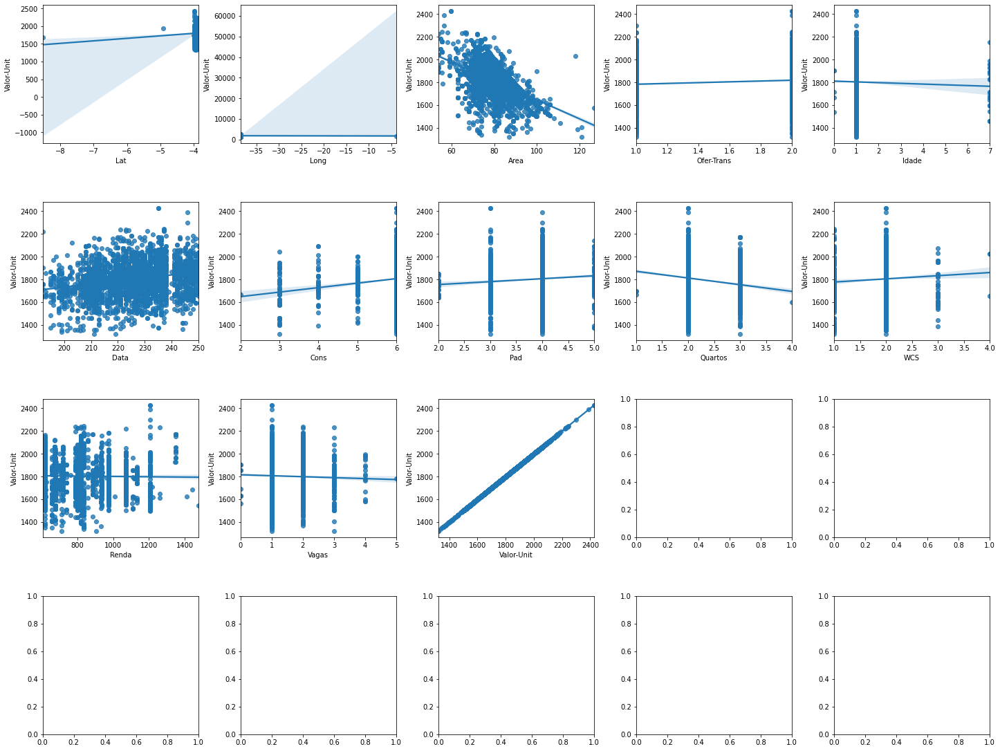

In [51]:
fig, axs = plt.subplots(ncols=5, nrows=4, figsize=(20, 15))
index = 0
axs = axs.flatten()
for i, k in enumerate(df.columns):
    sns.regplot(y=df['Valor-Unit'], x=df[k], ax=axs[i])
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)


In [52]:
#Identify Highly Correlated Features
# Create correlation matrix
corr_matrix = df.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find index of feature columns with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] > 0.80)]
#Drop Marked Features
# Drop features 
df.drop(df[to_drop], axis=1,inplace=True)
df

,Lat,Area,Ofer-Trans,Idade,Data,Cons,Pad,Quartos,WCS,Renda,Vagas,Valor-Unit
0,-3.883211,97.34,1.0,1.0,245.0,6.0,4.0,3.0,2.0,1070.31,2.0,1643.72
1,-3.884833,96.27,1.0,1.0,241.0,6.0,4.0,3.0,2.0,616.98,2.0,1661.99
2,-3.889294,95.33,2.0,1.0,243.0,6.0,4.0,2.0,2.0,616.98,1.0,1678.38
3,-3.891722,94.54,2.0,1.0,239.0,6.0,4.0,3.0,2.0,616.98,2.0,1692.41
4,-3.885028,96.48,2.0,1.0,245.0,6.0,4.0,3.0,2.0,616.98,2.0,1762.02
...,...,...,...,...,...,...,...,...,...,...,...,...
3585,-3.884733,84.00,1.0,1.0,247.0,6.0,5.0,2.0,2.0,798.60,2.0,1904.76
3586,-3.881930,104.34,1.0,1.0,246.0,6.0,4.0,3.0,2.0,616.98,2.0,1619.70
3587,-3.923474,80.98,1.0,1.0,245.0,6.0,4.0,2.0,2.0,800.65,1.0,1901.70
3588,-3.921058,81.61,1.0,1.0,242.0,6.0,4.0,2.0,2.0,800.65,1.0,1899.28


In [53]:
x_imovel.drop(x_imovel[to_drop], axis=1,inplace=True)

x_imovel

,Lat,Area,Ofer-Trans,Idade,Data,Cons,Pad,Quartos,WCS,Renda,Vagas
0,-3.92413,81.6,1,1,252,6,4,2,2,836.21,1


h2o Model

In [54]:

df_h2o = h2o.H2OFrame(df)
x_imovel_h20 = h2o.H2OFrame(x_imovel)
df_h2o

Parse progress: |█████████████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%


Lat,Area,Ofer-Trans,Idade,Data,Cons,Pad,Quartos,WCS,Renda,Vagas,Valor-Unit
-3.88321,97.34,1,1,245,6,4,3,2,1070.31,2,1643.72
-3.88483,96.27,1,1,241,6,4,3,2,616.98,2,1661.99
-3.88929,95.33,2,1,243,6,4,2,2,616.98,1,1678.38
-3.89172,94.54,2,1,239,6,4,3,2,616.98,2,1692.41
-3.88503,96.48,2,1,245,6,4,3,2,616.98,2,1762.02
-3.90692,88.58,2,1,241,6,4,2,2,817.98,1,1806.28
-3.88905,82.41,2,1,244,6,4,2,2,616.98,1,1820.17
-3.88791,82,1,1,242,6,4,2,2,616.98,1,1829.27
-3.92206,81.6,2,1,244,6,4,2,2,800.65,1,1838.24
-3.88978,80.25,2,1,242,6,4,2,2,616.98,1,1869.16


In [55]:
splits = df_h2o.split_frame(ratios = [0.7], seed = 0)
train = splits[0]
test = splits[1]



In [56]:
y='Valor-Unit'



Run AutoML
Run AutoML, stopping after 60 seconds. The max_runtime_secs argument provides a way to limit the AutoML run by time. When using a time-limited stopping criterion, the number of models train will vary between runs. If different hardware is used or even if the same machine is used but the available compute resources on that machine are not the same between runs, then AutoML may be able to train more models on one run vs another.
The test frame is passed explicitly to the leaderboard_frame argument here, which means that instead of using cross-validated metrics, we use test set metrics for generating the leaderboard.

In [57]:
#aml = H2OAutoML(max_runtime_secs = 60, seed = 1, project_name = "House")
#aml.train(y = y, training_frame = train, leaderboard_frame = test)

For demonstration purposes, we will also execute a second AutoML run, this time providing the original, full dataset, df (without passing a leaderboard_frame). This is a more efficient use of our data since we can use 100% of the data for training, rather than 80% like we did above. This time our leaderboard will use cross-validated metrics.
Note: Using an explicit leaderboard_frame for scoring may be useful in some cases, which is why the option is available.

In [58]:
aml2 = H2OAutoML(max_runtime_secs = 60, seed = 1, project_name = "House")
aml2.train(y = y, training_frame = df_h2o)

AutoML progress: |
14:49:22.502: New models will be added to existing leaderboard House@@Valor_Unit (leaderboard frame=null) with already 20 models.

████████████████████████████████████████████████████████| 100%

14:50:25.509: StackedEnsemble_AllModels_AutoML_20210110_144922 [StackedEnsemble all (built using all AutoML models)] failed: water.exceptions.H2OIllegalArgumentException: Failed to find the xval predictions frame. . .  Looks like keep_cross_validation_predictions wasn't set when building the models, or the frame was deleted.



Leaderboard
Next, we will view the AutoML Leaderboard. Since we specified a leaderboard_frame in the H2OAutoML.train() method for scoring and ranking the models, the AutoML leaderboard uses the performance on this data to rank the models.
After viewing the "powerplant_lb_frame" AutoML project leaderboard, we compare that to the leaderboard for the "powerplant_full_data" project. We can see that the results are better when the full dataset is used for training.
A default performance metric for each machine learning task (binary classification, multiclass classification, regression) is specified internally and the leaderboard will be sorted by that metric. In the case of regression, the default ranking metric is mean residual deviance. In the future, the user will be able to specify any of the H2O metrics so that different metrics can be used to generate rankings on the leaderboard.

Now we will view a snapshot of the top models. Here we should see the two Stacked Ensembles at or near the top of the leaderboard. Stacked Ensembles can almost always outperform a single model

In [59]:
aml2.leaderboard.head()

model_id,mean_residual_deviance,rmse,mse,mae,rmsle
StackedEnsemble_AllModels_AutoML_20210110_143908,6779.04,82.3349,6779.04,54.6873,0.0464944
StackedEnsemble_BestOfFamily_AutoML_20210110_143908,6856.05,82.8012,6856.05,55.4827,0.0467597
XGBoost_1_AutoML_20210110_144922,7035.9,83.8803,7035.9,59.1051,0.0472924
StackedEnsemble_BestOfFamily_AutoML_20210110_144922,7039.55,83.902,7039.55,59.5085,0.0473094
XGBoost_grid__1_AutoML_20210110_143908_model_1,7047.52,83.9495,7047.52,53.0882,0.0473931
XGBoost_grid__1_AutoML_20210110_144922_model_1,7047.52,83.9495,7047.52,53.0882,0.0473931
XGBoost_2_AutoML_20210110_144922,7159.86,84.6159,7159.86,59.8264,0.0476589
XGBoost_grid__1_AutoML_20210110_144922_model_2,7214.41,84.9377,7214.41,57.995,0.0479479
XGBoost_grid__1_AutoML_20210110_143908_model_2,7234.17,85.0539,7234.17,58.0443,0.0480258
XGBoost_2_AutoML_20210110_143908,7248.83,85.1401,7248.83,60.3277,0.0478993


In [60]:
# To see best parameters
aml2.leader.params
#aml2.leader.params.keys()
#aml2.leader.params['metalearner_algorithm']

{'auc_type': {'actual': 'AUTO', 'default': 'AUTO', 'input': 'AUTO'},
 'base_models': {'actual': [{'URL': None,
    '__meta': {'schema_name': 'KeyV3',
     'schema_type': 'Key<Keyed>',
     'schema_version': 3},
    'name': 'XGBoost_grid__1_AutoML_20210110_143908_model_1',
    'type': 'Key<Keyed>'},
   {'URL': None,
    '__meta': {'schema_name': 'KeyV3',
     'schema_type': 'Key<Keyed>',
     'schema_version': 3},
    'name': 'XGBoost_grid__1_AutoML_20210110_143908_model_2',
    'type': 'Key<Keyed>'},
   {'URL': None,
    '__meta': {'schema_name': 'KeyV3',
     'schema_type': 'Key<Keyed>',
     'schema_version': 3},
    'name': 'XGBoost_2_AutoML_20210110_143908',
    'type': 'Key<Keyed>'},
   {'URL': None,
    '__meta': {'schema_name': 'KeyV3',
     'schema_type': 'Key<Keyed>',
     'schema_version': 3},
    'name': 'XGBoost_3_AutoML_20210110_143908',
    'type': 'Key<Keyed>'},
   {'URL': None,
    '__meta': {'schema_name': 'KeyV3',
     'schema_type': 'Key<Keyed>',
     'schema_version

Predict Using Leader Model
If you need to generate predictions on a test set, you can make predictions on the "H2OAutoML" object directly, or on the leader model object.

In [61]:

pred = aml2.predict(test)
pred.head()

stackedensemble prediction progress: |████████████████████████████████████| 100%


predict
1681.72
1784.6
1831.19
1858.65
1846.6
1857.04
1943.18
1654.56
1733.27
1689.68


If needed, the standard model_performance() method can be applied to the AutoML leader model and a test set to generate an H2O model performance object.

In [62]:
test

Lat,Area,Ofer-Trans,Idade,Data,Cons,Pad,Quartos,WCS,Renda,Vagas,Valor-Unit
-3.89172,94.54,2,1,239,6,4,3,2,616.98,2,1692.41
-3.90692,88.58,2,1,241,6,4,2,2,817.98,1,1806.28
-3.88791,82,1,1,242,6,4,2,2,616.98,1,1829.27
-3.92872,82.64,1,1,245,6,4,2,2,903.93,1,1875.61
-3.89556,87.78,1,1,244,6,4,2,2,859.48,1,1879.7
-3.90964,84.98,1,1,241,6,4,2,2,817.98,1,1882.8
-3.92223,80,2,1,242,6,4,3,1,800.65,2,2000
-3.92213,80,2,1,243,6,4,3,2,800.65,2,1612.5
-3.88963,80.25,2,1,242,6,4,2,2,616.98,1,1619.94
-3.88466,96.27,1,1,244,6,4,3,2,616.98,2,1661.99


In [63]:

perf = aml2.leader.model_performance(test)
perf


ModelMetricsRegressionGLM: stackedensemble
** Reported on test data. **

MSE: 791.2270676046786
RMSE: 28.12875872847358
MAE: 21.487082337754025
RMSLE: 0.015901940491665722
R^2: 0.9611647424169266
Mean Residual Deviance: 791.2270676046786
Null degrees of freedom: 1066
Residual degrees of freedom: 1063
Null deviance: 21745580.138643883
Residual deviance: 844239.2811341921
AIC: 10158.730014773753


In [64]:
resultados=test
resultados['Vlr_prev']=pred

In [65]:
resultados

Lat,Area,Ofer-Trans,Idade,Data,Cons,Pad,Quartos,WCS,Renda,Vagas,Valor-Unit,Vlr_prev
-3.89172,94.54,2,1,239,6,4,3,2,616.98,2,1692.41,1681.72
-3.90692,88.58,2,1,241,6,4,2,2,817.98,1,1806.28,1784.6
-3.88791,82,1,1,242,6,4,2,2,616.98,1,1829.27,1831.19
-3.92872,82.64,1,1,245,6,4,2,2,903.93,1,1875.61,1858.65
-3.89556,87.78,1,1,244,6,4,2,2,859.48,1,1879.7,1846.6
-3.90964,84.98,1,1,241,6,4,2,2,817.98,1,1882.8,1857.04
-3.92223,80,2,1,242,6,4,3,1,800.65,2,2000,1943.18
-3.92213,80,2,1,243,6,4,3,2,800.65,2,1612.5,1654.56
-3.88963,80.25,2,1,242,6,4,2,2,616.98,1,1619.94,1733.27
-3.88466,96.27,1,1,244,6,4,3,2,616.98,2,1661.99,1689.68


In [66]:

x_imovel_h20

Lat,Area,Ofer-Trans,Idade,Data,Cons,Pad,Quartos,WCS,Renda,Vagas
-3.92413,81.6,1,1,252,6,4,2,2,836.21,1


In [67]:
y_imovel = aml2.predict(x_imovel_h20)
y_imovel

stackedensemble prediction progress: |████████████████████████████████████| 100%


predict
1907.33


In [68]:

print("Valor Unitário:",y_imovel.flatten())
print("Valor do imóvel:",y_imovel.flatten() * x_imovel['Area'][0])


Valor Unitário: 1907.3265918788827
Valor do imóvel: 155637.84989731683
